# ============================================================
# CSE 475 - Assignment: Weeds Object Detection
# Notebook 1 of 3 — **YOLOv10n**
# ============================================================

### Group: 02
1. **Osama Bin Qashem** (2022-2-60-058)  
2. **Saif Khan** (2022-2-60-063)  
3. **Mahmudul Hasan Hamim** (2022-2-60-079)  
4. **Nusrat Jahan Oishi** (2022-2-60-033)

---

## Institution
**East West University**  
Department of Computer Science and Engineering  

Course Code: **CSE 475** | Section: **03**  
Instructor: **Dr. Md. Rifat Ahmmad Rashid**  

**Model Focus (this notebook): YOLOv10n**  

---

## Goal
Train and evaluate **YOLOv10n** on the *weeds-dataset* (Roboflow YOLO format), then generate explainability visualizations:

- **ScoreCAM** (gradient-free CAM)
- **EigenCAM** (PCA-based CAM)

### Required Plot Layout
**Columns:** Original | ScoreCAM | EigenCAM | Prediction  
**Rows:** Model names vertically (this notebook defaults to one row: **YOLOv10n**)

---

## Dataset
- **Dataset name:** weeds-dataset  
- **Format:** YOLO (images/ + labels/ .txt)  
- **Size:** ~4800 images (as provided)

# 0) Environment Setup

In [1]:
# ============================================================
# Install required libraries
# ============================================================
!pip install -q ultralytics --no-deps
!pip install -q ttach  # optional; kept for compatibility with CAM-style workflows

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 25.9 MB/s eta 0:00:00


In [2]:
# ============================================================
# Common imports + global config
# ============================================================
import os
import random
from pathlib import Path

import cv2
import yaml
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn

from ultralytics import YOLO

# Plot defaults
plt.rcParams["figure.figsize"] = (8, 8)
plt.rcParams["axes.grid"] = False

# Reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

# Kaggle dataset paths
DATA_ROOT = Path("/kaggle/input/weeds-dataset")
RAW_DATA_YAML = DATA_ROOT / "data.yaml"
WORK_YAML = Path("/kaggle/working/weeds.yaml")

# Train config
MODEL_ID = "yolov10n.pt"
MODEL_NAME = "YOLOv10n"
EPOCHS = 100
BATCH_SIZE = 16
IMAGE_SIZE = 640
PATIENCE = 15
DEVICE = 0  

print("DATA_ROOT:", DATA_ROOT)
print("RAW_DATA_YAML:", RAW_DATA_YAML)
print("WORK_YAML:", WORK_YAML)
print("MODEL:", MODEL_ID)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
DATA_ROOT: /kaggle/input/weeds-dataset
RAW_DATA_YAML: /kaggle/input/weeds-dataset/data.yaml
WORK_YAML: /kaggle/working/weeds.yaml
MODEL: yolov10n.pt


# 1) Dataset Setup (weeds.yaml + quick sanity checks)

In [3]:
# ============================================================
# Build a robust weeds.yaml for Ultralytics
# - Reads names/nc from Roboflow data.yaml if present
# - Points directly to Kaggle dataset split paths
# ============================================================
def make_work_yaml(data_root: Path, raw_yaml: Path, out_yaml: Path):
    names = ["Weeds"]
    nc = 1

    if raw_yaml.exists():
        try:
            raw = yaml.safe_load(raw_yaml.read_text())
            if isinstance(raw, dict):
                if "names" in raw and raw["names"]:
                    names = raw["names"] if isinstance(raw["names"], list) else list(raw["names"])
                if "nc" in raw:
                    nc = int(raw["nc"])
        except Exception as e:
            print("[WARN] Could not parse data.yaml safely:", e)

    data_yaml = {
        "train": str((data_root / "train" / "images").resolve()).replace("\\", "/"),
        "val":   str((data_root / "valid" / "images").resolve()).replace("\\", "/"),
        "test":  str((data_root / "test" / "images").resolve()).replace("\\", "/"),
        "nc": nc,
        "names": names,
    }

    out_yaml.write_text(yaml.dump(data_yaml, sort_keys=False))
    return data_yaml

cfg = make_work_yaml(DATA_ROOT, RAW_DATA_YAML, WORK_YAML)
print("weeds.yaml written to:", WORK_YAML)
print(yaml.dump(cfg, sort_keys=False))

CLASS_NAMES = cfg["names"]
NC = cfg["nc"]

weeds.yaml written to: /kaggle/working/weeds.yaml
train: /kaggle/input/weeds-dataset/train/images
val: /kaggle/input/weeds-dataset/valid/images
test: /kaggle/input/weeds-dataset/test/images
nc: 1
names:
- Weeds



In [4]:
# ============================================================
# Helper: list images in a directory (common extensions)
# ============================================================
IMG_EXTS = (".jpg", ".jpeg", ".png", ".bmp", ".webp")

def list_images(img_dir: Path):
    files = []
    for ext in IMG_EXTS:
        files.extend(img_dir.glob(f"*{ext}"))
    return sorted(files)

def label_path_from_image(img_path: Path):
    # YOLO convention: .../images/x.jpg -> .../labels/x.txt
    return img_path.parent.parent / "labels" / f"{img_path.stem}.txt"

def read_yolo_labels(txt_path: Path):
    # returns list of (cls, x, y, w, h) in normalized coords
    rows = []
    if not txt_path.exists():
        return rows
    with open(txt_path, "r") as f:
        for line in f:
            line = line.strip()
            if not line:
                continue
            parts = line.split()
            if len(parts) < 5:
                continue
            cls, x, y, w, h = parts[:5]
            rows.append((int(float(cls)), float(x), float(y), float(w), float(h)))
    return rows

In [5]:
# ============================================================
# Quick split counts (images only)
# ============================================================
split_dirs = {
    "train": Path(cfg["train"]),
    "val":   Path(cfg["val"]),
    "test":  Path(cfg["test"]),
}

for k, d in split_dirs.items():
    imgs = list_images(d)
    print(f"{k:>5}: {len(imgs)} images | path={d}")

train: 2942 images | path=/kaggle/input/weeds-dataset/train/images
  val: 630 images | path=/kaggle/input/weeds-dataset/valid/images
 test: 631 images | path=/kaggle/input/weeds-dataset/test/images


## (Optional) Deep Dataset Statistics
Scans images + labels to compute:
- split sizes
- label file health
- class distribution
- image resolution stats
- bbox stats (normalized + pixels)
- SSL labeled/unlabeled example list (train only)


========== SPLIT COUNTS ==========
train: images= 2942 ( 70.0%), objects=  8037 ( 70.6%)
  val: images=  630 ( 15.0%), objects=  1694 ( 14.9%)
 test: images=  631 ( 15.0%), objects=  1654 ( 14.5%)

Total images: 4203
Total objects: 11385

========== LABEL FILE HEALTH ==========
Images missing label file: 0
Images with empty label file: 0

========== OBJECTS PER IMAGE ==========
count    4203.000000
mean        2.708779
std         2.737159
min         1.000000
50%         2.000000
75%         3.000000
90%         6.000000
95%         9.000000
max        16.000000

========== IMAGE RESOLUTION ==========
        img_w   img_h  img_area_px
count  4203.0  4203.0       4203.0
mean    512.0   512.0     262144.0
std       0.0     0.0          0.0
min     512.0   512.0     262144.0
50%     512.0   512.0     262144.0
75%     512.0   512.0     262144.0
90%     512.0   512.0     262144.0
95%     512.0   512.0     262144.0
max     512.0   512.0     262144.0

========== BBOX STATS (NORMALIZED) ===

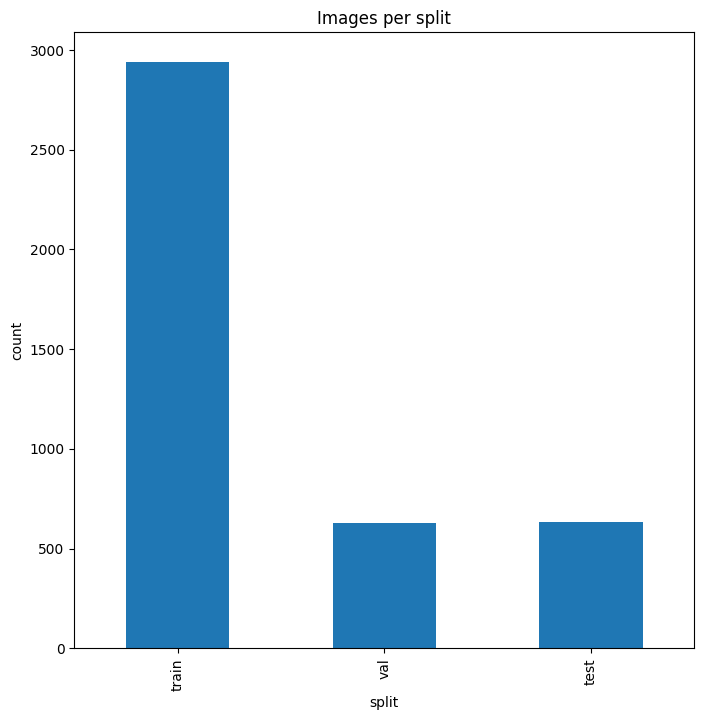

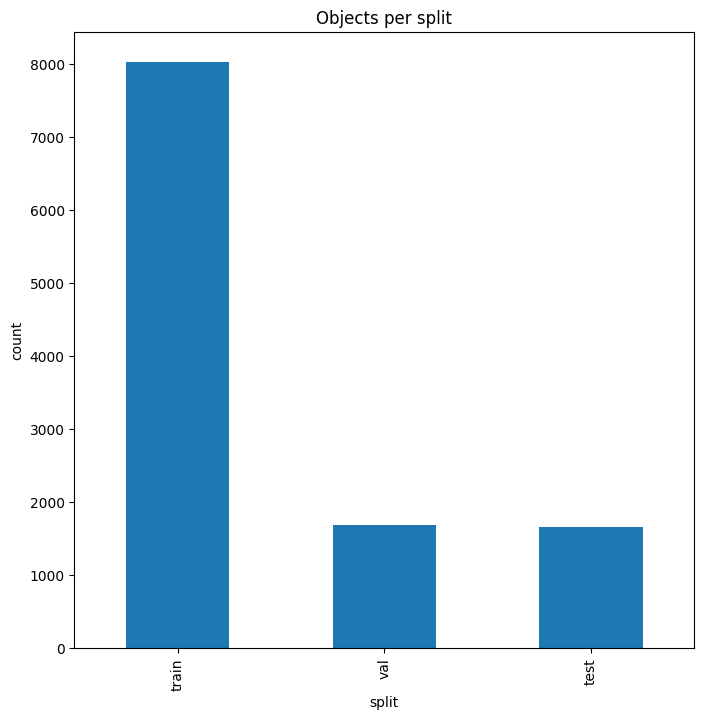

In [6]:
# ============================================================
# ONE-CELL: Deep dataset statistics (optional)
# ============================================================
import numpy as np

SPLIT_MAP = {
    "train": ("train", "images"),
    "val":   ("valid", "images"),
    "test":  ("test", "images"),
}

SSL_LABELED_RATIO = 0.20
SSL_SEED = 42

records = []         # per-box records
img_records = []     # per-image records

for split in ["train", "val", "test"]:
    img_dir = Path(DATA_ROOT / SPLIT_MAP[split][0] / SPLIT_MAP[split][1])
    if not img_dir.exists():
        print(f"[WARN] Missing split path: {split} -> {img_dir}")
        continue

    imgs = list_images(img_dir)
    for img_path in imgs:
        im = cv2.imread(str(img_path))
        if im is None:
            continue
        h_px, w_px = im.shape[:2]

        lbl_path = label_path_from_image(img_path)
        boxes = read_yolo_labels(lbl_path)

        img_records.append({
            "split": split,
            "image_path": str(img_path),
            "label_path": str(lbl_path),
            "has_label_file": lbl_path.exists(),
            "n_objects": len(boxes),
            "img_w": w_px,
            "img_h": h_px,
            "img_area_px": w_px * h_px,
        })

        for (cls, x, y, bw, bh) in boxes:
            bw_px = bw * w_px
            bh_px = bh * h_px
            area_norm = bw * bh
            area_px = bw_px * bh_px
            ar = (bw / bh) if bh > 0 else np.nan
            records.append({
                "split": split,
                "image_path": str(img_path),
                "cls": cls,
                "x_center": x,
                "y_center": y,
                "bw_norm": bw,
                "bh_norm": bh,
                "area_norm": area_norm,
                "aspect_ratio": ar,
                "img_w": w_px,
                "img_h": h_px,
                "bw_px": bw_px,
                "bh_px": bh_px,
                "area_px": area_px,
            })

df_boxes = pd.DataFrame(records)
df_imgs = pd.DataFrame(img_records)

def pct(a, b):
    return (100.0 * a / b) if b else 0.0

print("\n========== SPLIT COUNTS ==========")
split_img_counts = df_imgs.groupby("split")["image_path"].nunique().to_dict()
split_obj_counts = df_imgs.groupby("split")["n_objects"].sum().to_dict()

total_imgs = sum(split_img_counts.values())
total_objs = sum(split_obj_counts.values())

for split in ["train", "val", "test"]:
    ni = split_img_counts.get(split, 0)
    no = split_obj_counts.get(split, 0)
    print(f"{split:>5}: images={ni:5d} ({pct(ni,total_imgs):5.1f}%), objects={no:6d} ({pct(no,total_objs):5.1f}%)")

print("\nTotal images:", total_imgs)
print("Total objects:", total_objs)

missing_lbl = df_imgs[(df_imgs["has_label_file"] == False)]
empty_lbl = df_imgs[(df_imgs["has_label_file"] == True) & (df_imgs["n_objects"] == 0)]
print("\n========== LABEL FILE HEALTH ==========")
print("Images missing label file:", len(missing_lbl))
print("Images with empty label file:", len(empty_lbl))

print("\n========== OBJECTS PER IMAGE ==========")
print(df_imgs["n_objects"].describe(percentiles=[0.5, 0.75, 0.9, 0.95]).to_string())

print("\n========== IMAGE RESOLUTION ==========")
print(df_imgs[["img_w","img_h","img_area_px"]].describe(percentiles=[0.5, 0.75, 0.9, 0.95]).to_string())

if len(df_boxes) > 0:
    print("\n========== BBOX STATS (NORMALIZED) ==========")
    print(df_boxes[["bw_norm","bh_norm","area_norm","aspect_ratio"]].describe(percentiles=[0.5, 0.75, 0.9, 0.95]).to_string())

    print("\n========== BBOX STATS (PIXELS) ==========")
    print(df_boxes[["bw_px","bh_px","area_px"]].describe(percentiles=[0.5, 0.75, 0.9, 0.95]).to_string())

    print("\n========== CLASS DISTRIBUTION ==========")
    cls_counts = df_boxes["cls"].value_counts().sort_index()
    for cls_id, cnt in cls_counts.items():
        name = CLASS_NAMES[cls_id] if cls_id < len(CLASS_NAMES) else f"class_{cls_id}"
        print(f"cls {cls_id:>2} ({name}): {cnt} boxes ({pct(cnt,len(df_boxes)):5.1f}%)")
else:
    print("\n[WARN] No boxes found. Check label paths or YOLO format.")

print("\n========== SSL SPLIT EXAMPLE (TRAIN ONLY) ==========")
train_imgs = df_imgs[df_imgs["split"]=="train"]["image_path"].unique().tolist()
random.Random(SSL_SEED).shuffle(train_imgs)

n_train = len(train_imgs)
n_labeled = int(round(SSL_LABELED_RATIO * n_train))
labeled_list = train_imgs[:n_labeled]
unlabeled_list = train_imgs[n_labeled:]

print(f"Train images: {n_train}")
print(f"Labeled ratio: {SSL_LABELED_RATIO:.2f} -> labeled={len(labeled_list)}, unlabeled={len(unlabeled_list)}")

# Quick plots
plt.figure()
df_imgs.groupby("split")["image_path"].nunique().reindex(["train","val","test"]).plot(kind="bar")
plt.title("Images per split")
plt.xlabel("split"); plt.ylabel("count")
plt.show()

plt.figure()
df_imgs.groupby("split")["n_objects"].sum().reindex(["train","val","test"]).plot(kind="bar")
plt.title("Objects per split")
plt.xlabel("split"); plt.ylabel("count")
plt.show()

## Visualize a few labeled samples (train/val/test)

Showing 3 sample images from 'train'


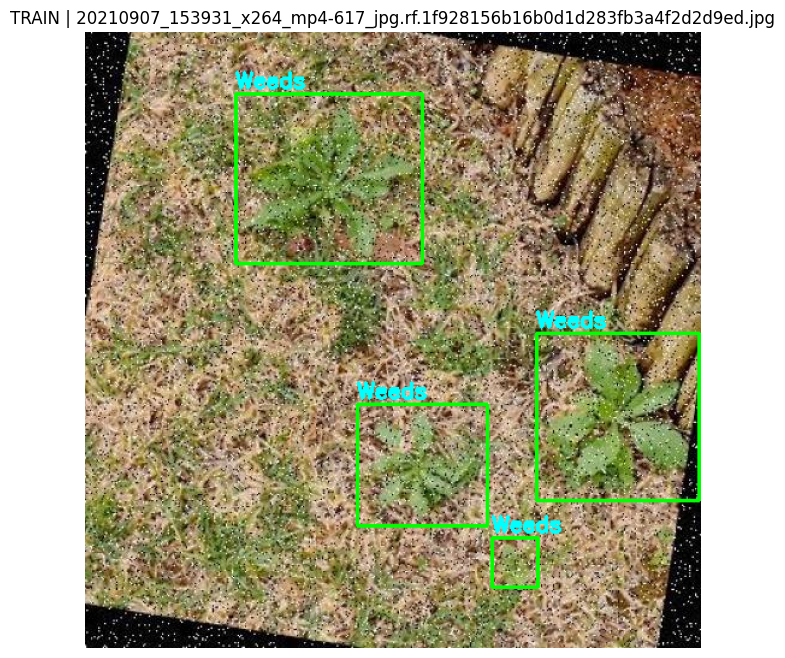

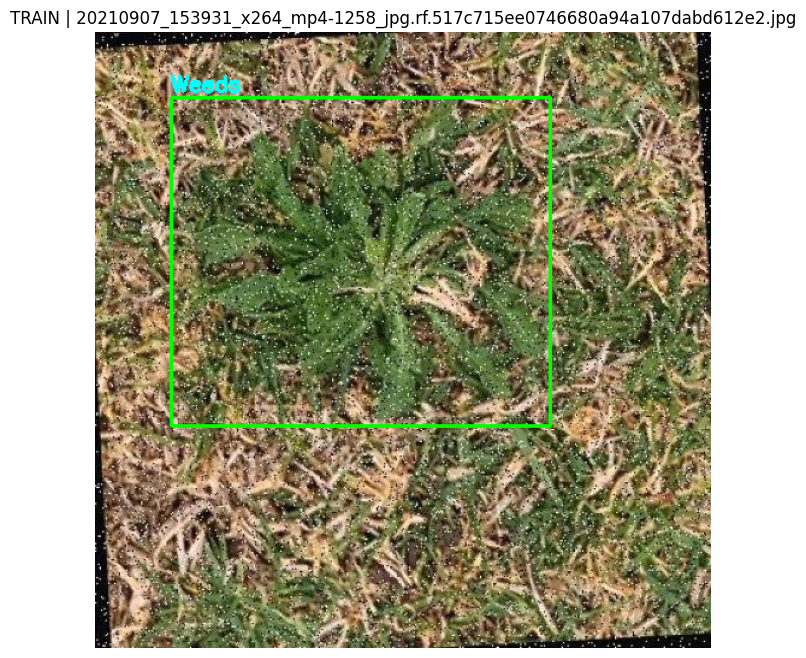

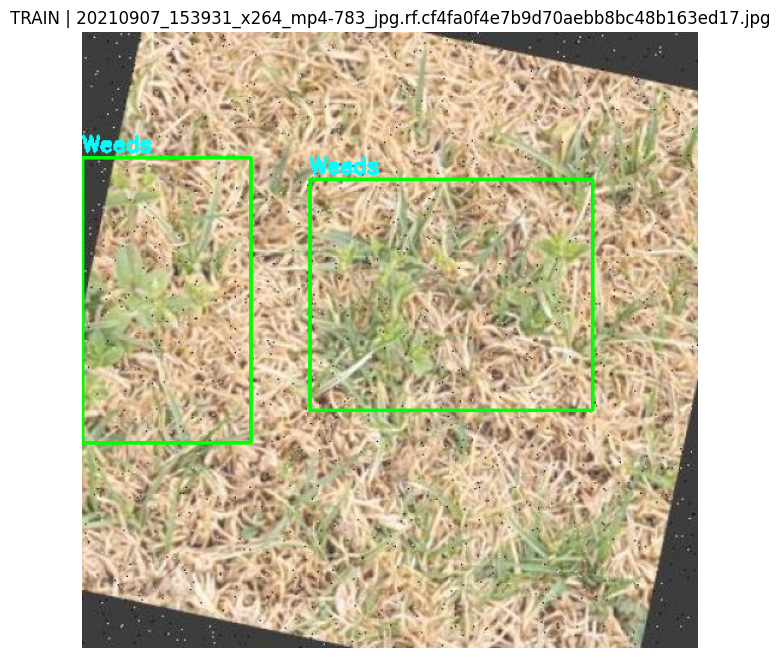

Showing 3 sample images from 'val'


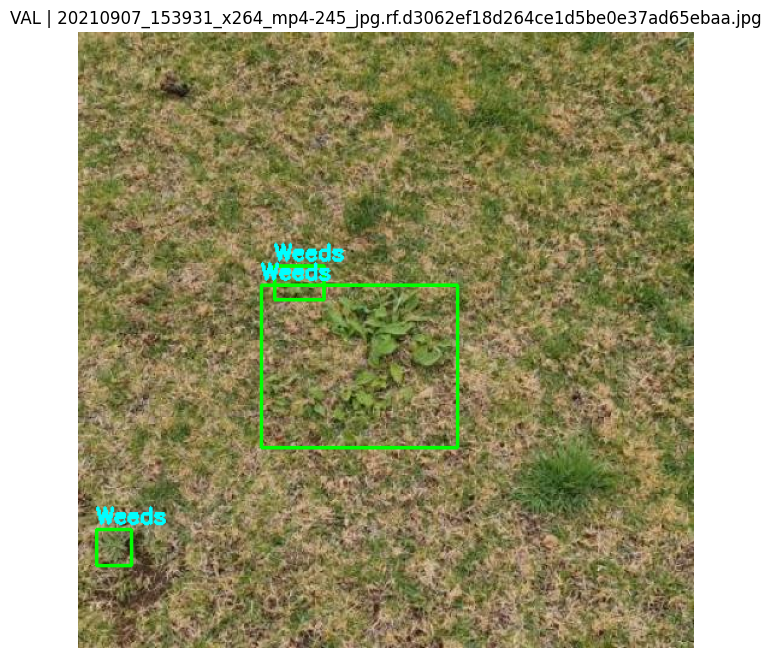

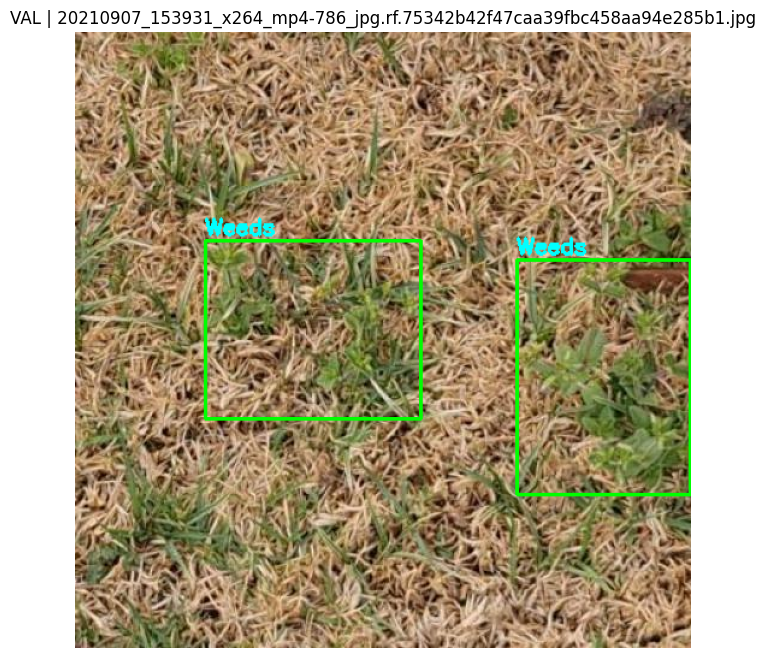

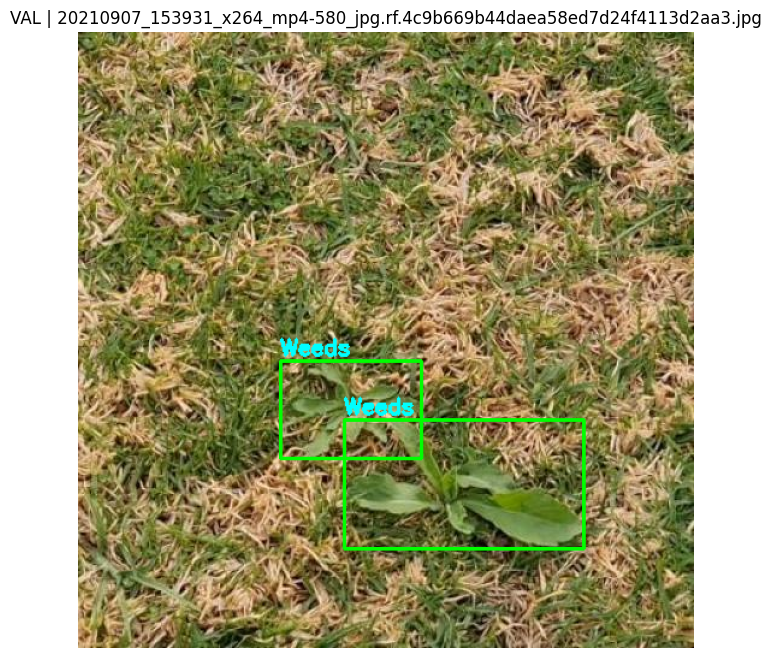

Showing 3 sample images from 'test'


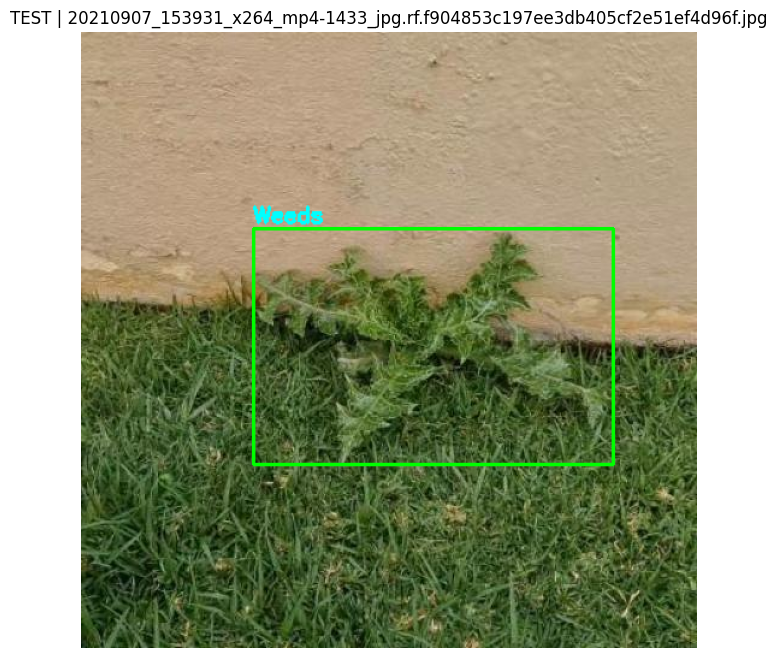

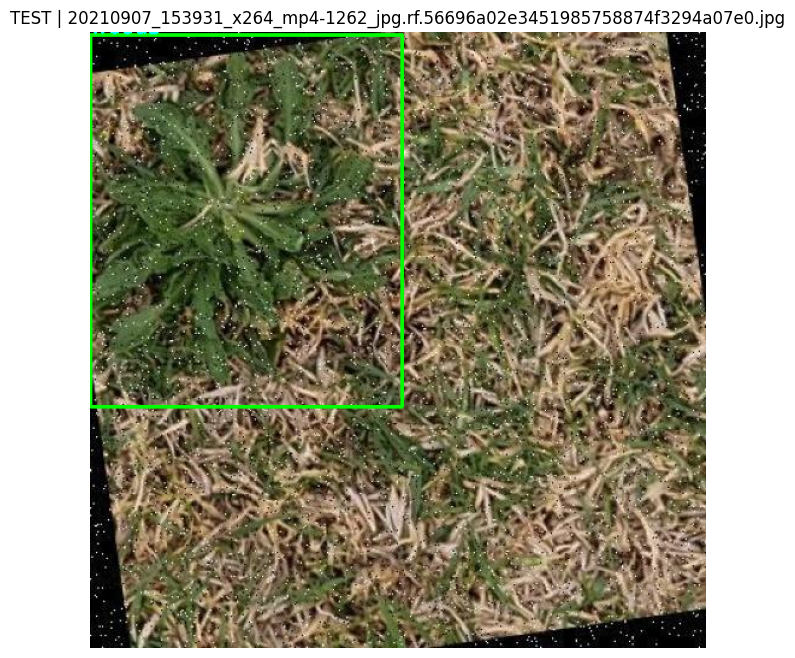

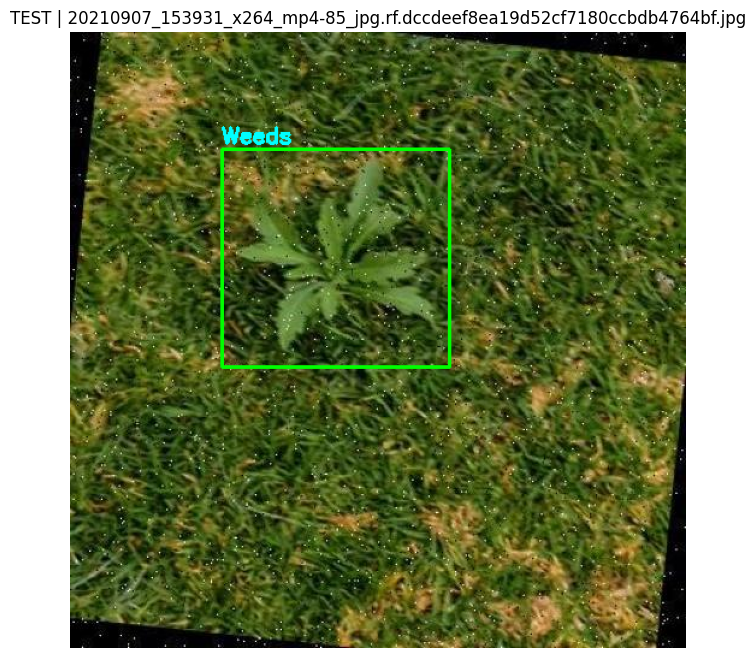

In [7]:
def visualize_yolo_split(split_key: str, num_images: int = 3):
    """
    split_key: "train" / "val" / "test"
    """
    image_dir = Path(cfg[split_key])
    label_dir = image_dir.parent / "labels"

    img_files = []
    for ext in IMG_EXTS:
        img_files.extend(image_dir.glob(f"*{ext}"))

    if len(img_files) == 0:
        print(f"No images found in {image_dir}")
        return

    random.shuffle(img_files)
    img_files = img_files[:num_images]
    print(f"Showing {len(img_files)} sample images from '{split_key}'")

    for img_path in img_files:
        label_path = label_dir / f"{img_path.stem}.txt"
        img = cv2.imread(str(img_path))
        if img is None:
            continue

        h, w = img.shape[:2]

        if label_path.exists():
            for cls, x, y, bw, bh in read_yolo_labels(label_path):
                x1 = int((x - bw / 2) * w)
                y1 = int((y - bh / 2) * h)
                x2 = int((x + bw / 2) * w)
                y2 = int((y + bh / 2) * h)

                cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
                cls_name = CLASS_NAMES[cls] if cls < len(CLASS_NAMES) else str(cls)
                cv2.putText(img, cls_name, (x1, max(0, y1 - 5)),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)

        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.figure()
        plt.imshow(img_rgb)
        plt.axis("off")
        plt.title(f"{split_key.upper()} | {img_path.name}")
        plt.show()

visualize_yolo_split("train", num_images=3)
visualize_yolo_split("val", num_images=3)
visualize_yolo_split("test", num_images=3)

# 2) Train YOLOv10n

In [8]:
# ============================================================
# Train YOLOv10n
# ============================================================
model_v10 = YOLO(MODEL_ID)

results_v10 = model_v10.train(
    data=str(WORK_YAML),
    epochs=EPOCHS,
    imgsz=IMAGE_SIZE,
    batch=BATCH_SIZE,
    project="/kaggle/working/weeds_yolov10_train",
    name="yolov10_weeds",
    device=DEVICE,
    patience=PATIENCE,
    workers=2,
    exist_ok=True,
)

BEST_WEIGHT_V10 = "/kaggle/working/weeds_yolov10_train/yolov10_weeds/weights/best.pt"
print("Training done.")
print("Best weights:", BEST_WEIGHT_V10)

Ultralytics 8.3.240 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/weeds.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov10n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov10_weeds, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=15, perspective=0.0, plo

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        630       1694      0.934      0.937      0.973      0.782
Speed: 0.2ms preprocess, 2.3ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to /kaggle/working/weeds_yolov10_train/yolov10_weeds
Training done.
Best weights: /kaggle/working/weeds_yolov10_train/yolov10_weeds/weights/best.pt


# 3) Evaluate YOLOv10n (Test Split)

In [9]:
# ============================================================
# Evaluate the trained YOLOv10n on test split and collect metrics
# ============================================================
from pathlib import Path

def evaluate_one_model(model_name: str, weight_path: str):
    weight_path = Path(weight_path)
    if not weight_path.exists():
        raise FileNotFoundError(f"Weights not found: {weight_path}")

    model = YOLO(str(weight_path))
    test_results = model.val(data=str(WORK_YAML), split="test")

    box_metrics = test_results.box
    p = box_metrics.p
    r = box_metrics.r

    precision = float(p.mean()) if hasattr(p, "mean") else float(p)
    recall = float(r.mean()) if hasattr(r, "mean") else float(r)
    map50 = float(box_metrics.map50)
    map5095 = float(box_metrics.map)

    f1 = (2 * precision * recall / (precision + recall)) if (precision + recall) > 0 else 0.0

    row = {
        "Model": model_name,
        "mAP@0.5": map50,
        "mAP@0.5:0.95": map5095,
        "Precision": precision,
        "Recall": recall,
        "F1 Score": f1,
    }
    return row

metrics_v10 = evaluate_one_model(MODEL_NAME, BEST_WEIGHT_V10)
df_metrics_v10 = pd.DataFrame([metrics_v10])
display(df_metrics_v10)

# Save metrics for report reuse
out_metrics_path = "/kaggle/working/metrics_yolov10.csv"
df_metrics_v10.to_csv(out_metrics_path, index=False)
print("Saved:", out_metrics_path)

Ultralytics 8.3.240 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv10n summary (fused): 102 layers, 2,265,363 parameters, 0 gradients
val: Fast image access ✅ (ping: 0.7±0.7 ms, read: 150.4±47.1 MB/s, size: 82.8 KB)
val: Scanning /kaggle/input/weeds-dataset/test/labels... 631 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 631/631 697.6it/s 0.9s
WARNING ⚠️ val: Cache directory /kaggle/input/weeds-dataset/test is not writable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 40/40 7.8it/s 5.1s


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        631       1654      0.942      0.941      0.977      0.787
Speed: 1.1ms preprocess, 2.6ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to /kaggle/working/runs/detect/val


,Model,mAP@0.5,mAP@0.5:0.95,Precision,Recall,F1 Score
0,YOLOv10n,0.976738,0.786675,0.941905,0.941037,0.941471


Saved: /kaggle/working/metrics_yolov10.csv


# 4) Training Curves (YOLOv10n)

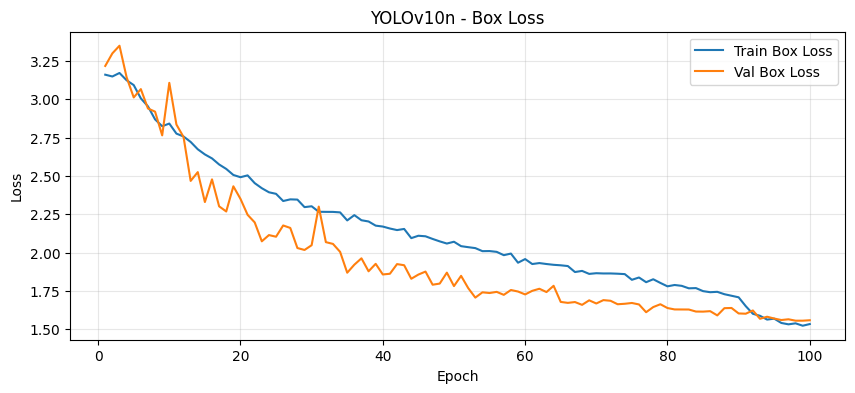

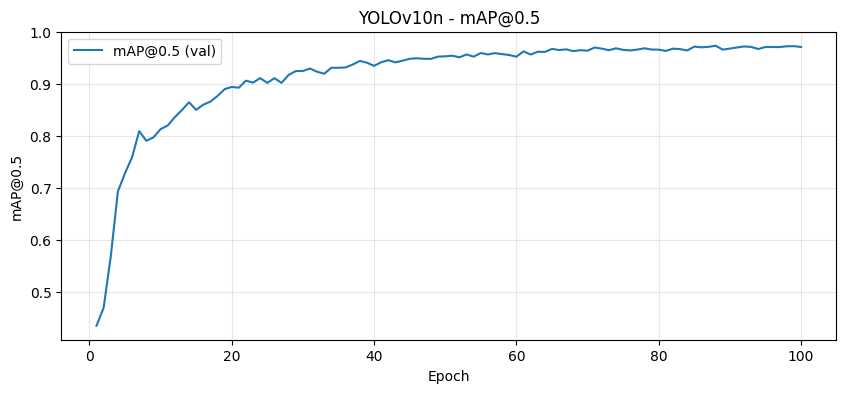

In [10]:
# ============================================================
# Plot YOLOv10 training curves from results.csv (if available)
# ============================================================
from pathlib import Path

PROJECT_DIR_V10 = Path("/kaggle/working/weeds_yolov10_train/yolov10_weeds")
csv_path = PROJECT_DIR_V10 / "results.csv"

if not csv_path.exists():
    print("results.csv not found:", csv_path)
else:
    df = pd.read_csv(csv_path)
    df.columns = df.columns.str.strip()

    # Loss curve
    plt.figure(figsize=(10, 4))
    if "train/box_loss" in df.columns:
        plt.plot(df["epoch"], df["train/box_loss"], label="Train Box Loss")
    if "val/box_loss" in df.columns:
        plt.plot(df["epoch"], df["val/box_loss"], label="Val Box Loss")
    plt.title("YOLOv10n - Box Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.show()

    # mAP50 curve
    plt.figure(figsize=(10, 4))
    if "metrics/mAP50(B)" in df.columns:
        plt.plot(df["epoch"], df["metrics/mAP50(B)"], label="mAP@0.5 (val)")
        plt.title("YOLOv10n - mAP@0.5")
        plt.xlabel("Epoch"); plt.ylabel("mAP@0.5")
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.show()
    else:
        print("metrics/mAP50(B) not found in results.csv columns.")

# 5) Qualitative Inference (GT vs Prediction)

In [11]:
# ============================================================
# Draw YOLO-format GT boxes
# ============================================================
def draw_yolo_annotations_on_rgb(rgb_img, label_path: Path, class_names):
    img = rgb_img.copy()
    h, w = img.shape[:2]
    if not label_path.exists():
        return img, 0

    gt_count = 0
    for cls, x, y, bw, bh in read_yolo_labels(label_path):
        x1 = int((x - bw / 2) * w)
        y1 = int((y - bh / 2) * h)
        x2 = int((x + bw / 2) * w)
        y2 = int((y + bh / 2) * h)

        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cls_name = class_names[cls] if cls < len(class_names) else str(cls)
        cv2.putText(img, cls_name, (x1, max(0, y1 - 4)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
        gt_count += 1
    return img, gt_count

Test images found: 631


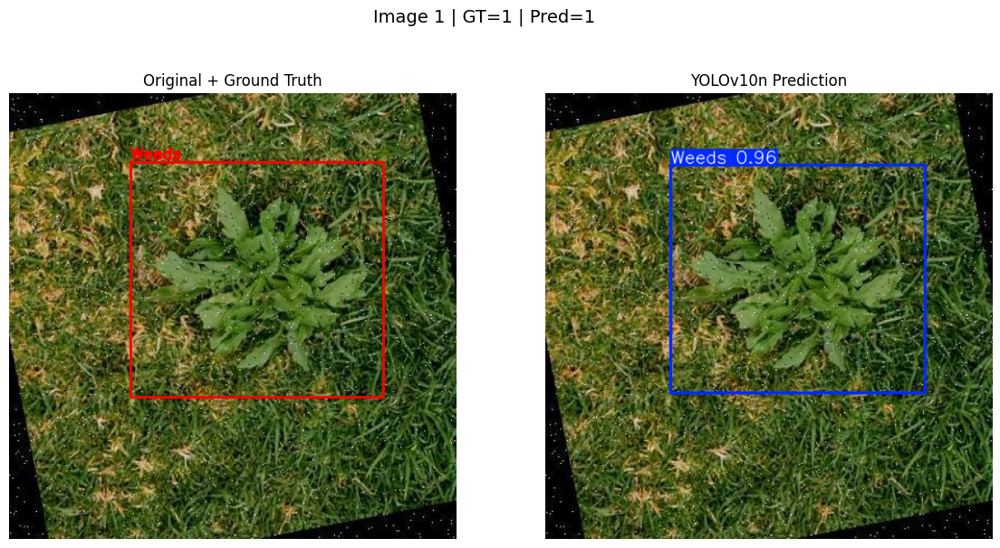

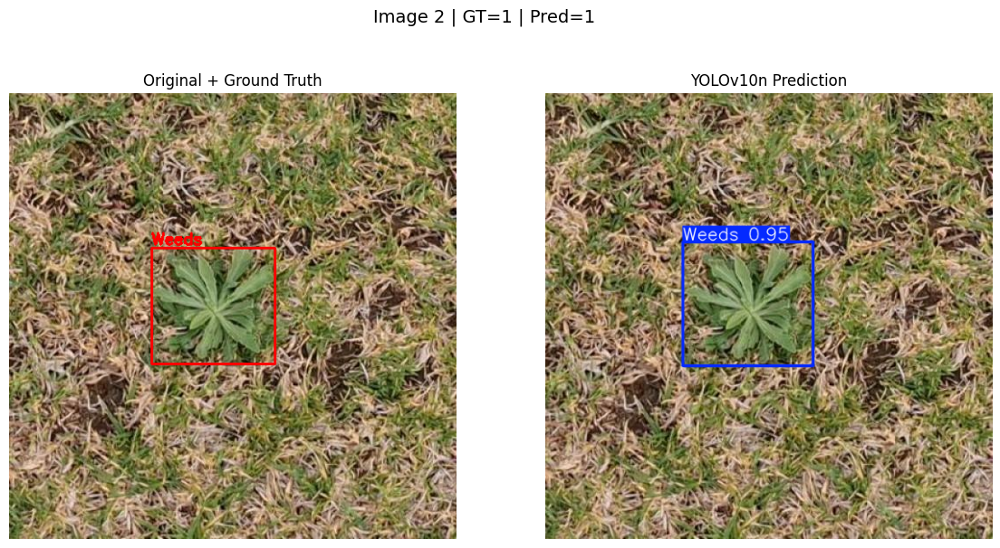

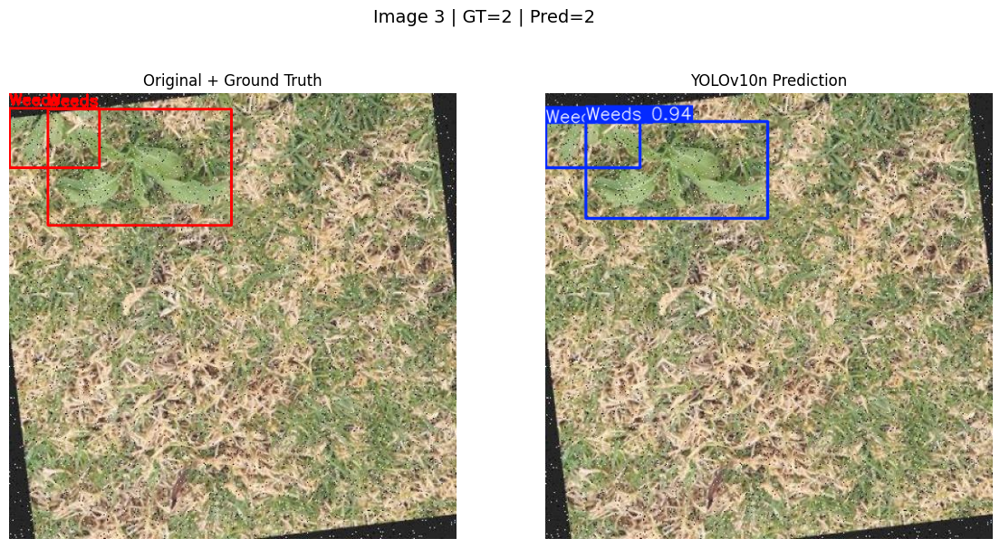

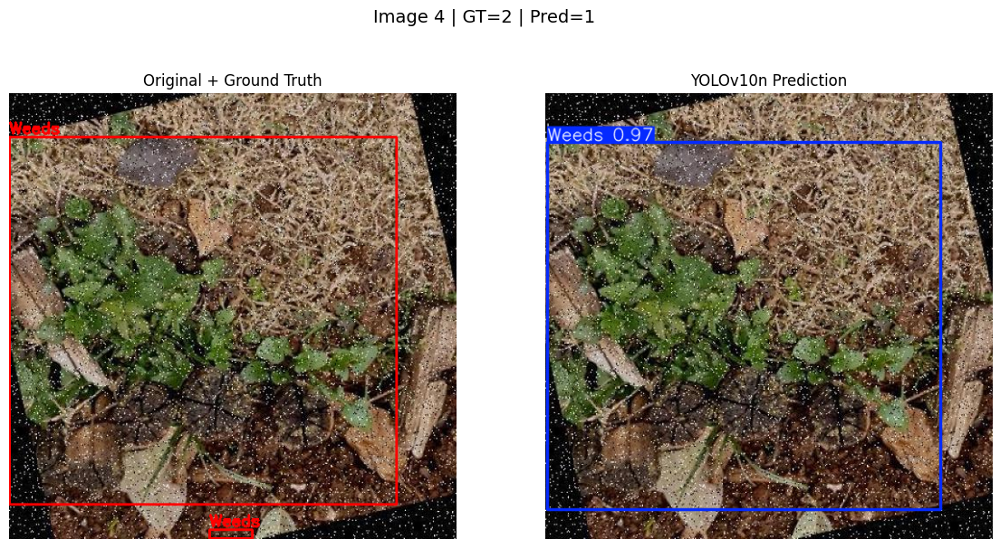

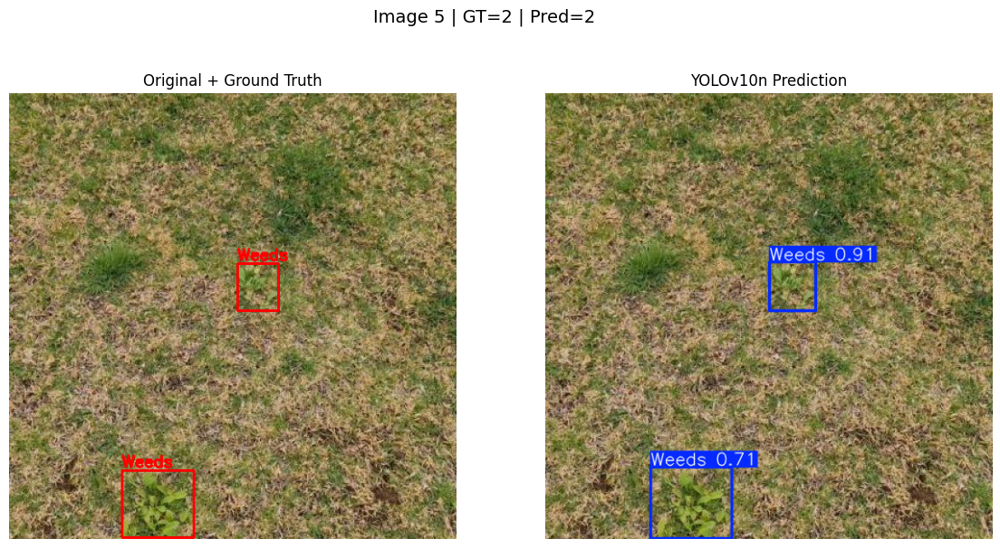

In [12]:
# ============================================================
# Show a few test images: GT vs YOLOv10n Prediction
# ============================================================
CONF_PRED = 0.25
IOU_PRED = 0.7

infer_model = YOLO(BEST_WEIGHT_V10)

test_dir = Path(cfg["test"])
test_imgs = []
for ext in IMG_EXTS:
    test_imgs.extend(test_dir.glob(f"*{ext}"))

print("Test images found:", len(test_imgs))
sample_paths = random.sample(test_imgs, k=min(5, len(test_imgs)))

label_dir = test_dir.parent / "labels"

for idx, img_path in enumerate(sample_paths, start=1):
    bgr = cv2.imread(str(img_path))
    if bgr is None:
        continue
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    gt_path = label_dir / f"{img_path.stem}.txt"
    gt_img, gt_count = draw_yolo_annotations_on_rgb(rgb, gt_path, CLASS_NAMES)

    results = infer_model.predict(bgr, imgsz=IMAGE_SIZE, conf=CONF_PRED, iou=IOU_PRED, device=DEVICE, verbose=False)
    r = results[0]
    pred_count = int(len(r.boxes)) if r.boxes is not None else 0

    pred_bgr = r.plot()
    pred_rgb = cv2.cvtColor(pred_bgr, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(14, 7))
    plt.suptitle(f"Image {idx} | GT={gt_count} | Pred={pred_count}", fontsize=14)

    plt.subplot(1, 2, 1)
    plt.imshow(gt_img)
    plt.axis("off")
    plt.title("Original + Ground Truth")

    plt.subplot(1, 2, 2)
    plt.imshow(pred_rgb)
    plt.axis("off")
    plt.title("YOLOv10n Prediction")

    plt.show()

# 6) Explainability (ScoreCAM + EigenCAM) + Required Grid Plot

### Design choices (kept simple + deterministic)
- **Target layer**: last `Conv2d` layer found in the model (works across most Ultralytics YOLO variants)
- **ScoreCAM score**: sum of detection confidences for the target class (default: class 0)
- **Speed control**: ScoreCAM uses only top-K channels by activation variance

In [13]:
# ============================================================
# CAM Utilities
# ============================================================
def find_last_conv_layer(module: nn.Module) -> nn.Module:
    last = None
    for m in module.modules():
        if isinstance(m, nn.Conv2d):
            last = m
    if last is None:
        raise ValueError("No Conv2d layer found in the model.")
    return last

def normalize01(x: np.ndarray, eps: float = 1e-6) -> np.ndarray:
    x = x.astype(np.float32)
    x_min, x_max = float(np.min(x)), float(np.max(x))
    if (x_max - x_min) < eps:
        return np.zeros_like(x, dtype=np.float32)
    return (x - x_min) / (x_max - x_min + eps)

def overlay_heatmap(rgb_uint8: np.ndarray, heatmap01: np.ndarray, alpha: float = 0.45) -> np.ndarray:
    """
    rgb_uint8: (H,W,3) uint8
    heatmap01: (H,W) float in [0,1]
    returns overlay RGB float image in [0,1]
    """
    heatmap_u8 = np.uint8(np.clip(heatmap01, 0, 1) * 255)
    heatmap_bgr = cv2.applyColorMap(heatmap_u8, cv2.COLORMAP_JET)
    heatmap_rgb = cv2.cvtColor(heatmap_bgr, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

    base = rgb_uint8.astype(np.float32) / 255.0
    out = (1 - alpha) * base + alpha * heatmap_rgb
    return np.clip(out, 0, 1)

def eigencam_from_activations(acts_chw: np.ndarray) -> np.ndarray:
    """
    acts_chw: (C,H,W) activations
    returns: (H,W) EigenCAM normalized to [0,1]
    """
    C, H, W = acts_chw.shape
    A = acts_chw.reshape(C, -1).T  # (H*W, C)
    A = np.nan_to_num(A)

    # SVD for PCA first component
    # A = U S Vt ; first PC direction is Vt[0]
    _, _, Vt = np.linalg.svd(A, full_matrices=False)
    pc = Vt[0]  # (C,)
    cam = (A @ pc).reshape(H, W)
    cam = np.maximum(cam, 0)
    return normalize01(cam)

def detection_score_sum_conf(yolo: YOLO, img_bgr: np.ndarray, class_id: int = 0,
                             imgsz: int = 640, conf: float = 0.001, iou: float = 0.7, device=0) -> float:
    """
    Score used by ScoreCAM: sum(conf) over detections of class_id.
    """
    res = yolo.predict(img_bgr, imgsz=imgsz, conf=conf, iou=iou, device=device, verbose=False)
    r = res[0]
    if r.boxes is None or len(r.boxes) == 0:
        return 0.0
    cls = r.boxes.cls.detach().cpu().numpy().astype(int)
    confs = r.boxes.conf.detach().cpu().numpy().astype(np.float32)
    if class_id is not None:
        confs = confs[cls == int(class_id)]
    return float(np.sum(confs)) if confs.size else 0.0

def scorecam_from_activations(
    yolo: YOLO,
    base_bgr: np.ndarray,
    acts_chw: np.ndarray,
    class_id: int = 0,
    imgsz: int = 640,
    max_channels: int = 24,
    conf_score: float = 0.001,
    iou_score: float = 0.7,
    device=0,
):
    """
    ScoreCAM (gradient-free):
      - upsample each activation channel -> mask in [0,1]
      - mask the input image
      - run detector on masked image -> scalar score
      - weighted sum of masks -> heatmap
    Returns: (imgsz, imgsz) heatmap in [0,1]
    """
    C, H, W = acts_chw.shape

    # pick channels by variance (top-K)
    flat = acts_chw.reshape(C, -1)
    var = flat.var(axis=1)
    k = int(min(max_channels, C))
    top_idx = np.argsort(-var)[:k]

    base_float = base_bgr.astype(np.float32) / 255.0
    heat = np.zeros((imgsz, imgsz), dtype=np.float32)

    for ch in top_idx:
        amap = acts_chw[ch]
        amap01 = normalize01(amap)
        mask = cv2.resize(amap01, (imgsz, imgsz), interpolation=cv2.INTER_LINEAR)
        mask = np.clip(mask, 0, 1)

        masked = (base_float * mask[..., None])
        masked_u8 = np.uint8(np.clip(masked * 255.0, 0, 255))

        s = detection_score_sum_conf(
            yolo=yolo,
            img_bgr=masked_u8,
            class_id=class_id,
            imgsz=imgsz,
            conf=conf_score,
            iou=iou_score,
            device=device,
        )
        heat += (s * mask.astype(np.float32))

    heat = np.maximum(heat, 0)
    return normalize01(heat)

def capture_activations_via_hook(
    yolo: YOLO,
    img_bgr: np.ndarray,
    target_layer: nn.Module,
    imgsz: int = 640,
    conf_pred: float = 0.25,
    iou_pred: float = 0.7,
    device=0,
):
    """
    Runs YOLO.predict once (on resized image) while capturing activations from target_layer.
    Returns:
      - result object (ultralytics Results for this image)
      - activations CHW as numpy float32
    """
    cache = {"acts": None}

    def _hook(_, __, output):
        # Expect output: (B,C,H,W)
        t = output
        if isinstance(t, (tuple, list)):
            t = t[0]
        if torch.is_tensor(t):
            cache["acts"] = t.detach().float().cpu()

    handle = target_layer.register_forward_hook(_hook)
    try:
        res = yolo.predict(img_bgr, imgsz=imgsz, conf=conf_pred, iou=iou_pred, device=device, verbose=False)
    finally:
        handle.remove()

    if cache["acts"] is None:
        raise RuntimeError("Activation hook did not capture any activations. Try a different target layer.")

    acts = cache["acts"]
    if acts.dim() == 3:
        acts = acts.unsqueeze(0)
    acts_chw = acts[0].numpy()  # (C,H,W)
    return res[0], acts_chw

In [14]:
# ============================================================
# Required grid plot:
# Columns: Original | ScoreCAM | EigenCAM | Prediction
# Rows: model names (vertical)
# ============================================================
def plot_xai_grid(
    models: dict,
    img_path: Path,
    class_id: int = 0,
    imgsz: int = 640,
    conf_pred: float = 0.25,
    iou_pred: float = 0.7,
    scorecam_channels: int = 24,
):
    """
    models: {row_name: weight_path_or_model_id}
    """
    # Load + resize base image (fixed size so CAM + prediction align)
    bgr0 = cv2.imread(str(img_path))
    if bgr0 is None:
        raise FileNotFoundError(f"Could not read image: {img_path}")
    base_bgr = cv2.resize(bgr0, (imgsz, imgsz), interpolation=cv2.INTER_LINEAR)
    base_rgb = cv2.cvtColor(base_bgr, cv2.COLOR_BGR2RGB)

    row_items = []
    for row_name, weights in models.items():
        try:
            y = YOLO(str(weights))
            row_items.append((row_name, y))
        except Exception as e:
            print(f"[WARN] Skipping {row_name} ({weights}): {e}")

    if len(row_items) == 0:
        raise RuntimeError("No models could be loaded.")

    n = len(row_items)
    fig, axes = plt.subplots(n, 4, figsize=(4 * 4.2, n * 4.2))
    if n == 1:
        axes = axes.reshape(1, 4)

    col_titles = ["Original", "ScoreCAM", "EigenCAM", "Prediction"]
    for j, t in enumerate(col_titles):
        axes[0, j].set_title(t, fontsize=13, fontweight="bold")

    for i, (row_name, yolo) in enumerate(row_items):
        # target layer
        target_layer = find_last_conv_layer(yolo.model)

        # prediction + activations
        r, acts_chw = capture_activations_via_hook(
            yolo=yolo,
            img_bgr=base_bgr,
            target_layer=target_layer,
            imgsz=imgsz,
            conf_pred=conf_pred,
            iou_pred=iou_pred,
            device=DEVICE,
        )

        # ---- Original
        axes[i, 0].imshow(base_rgb)
        axes[i, 0].axis("off")
        axes[i, 0].set_ylabel(row_name, fontsize=12, fontweight="bold", rotation=90)

        # ---- ScoreCAM
        sc = scorecam_from_activations(
            yolo=yolo,
            base_bgr=base_bgr,
            acts_chw=acts_chw,
            class_id=class_id,
            imgsz=imgsz,
            max_channels=scorecam_channels,
            conf_score=0.001,
            iou_score=iou_pred,
            device=DEVICE,
        )
        sc_overlay = overlay_heatmap(base_rgb, sc, alpha=0.45)
        axes[i, 1].imshow(sc_overlay)
        axes[i, 1].axis("off")

        # ---- EigenCAM
        ec_small = eigencam_from_activations(acts_chw)
        ec = cv2.resize(ec_small, (imgsz, imgsz), interpolation=cv2.INTER_LINEAR)
        ec_overlay = overlay_heatmap(base_rgb, ec, alpha=0.45)
        axes[i, 2].imshow(ec_overlay)
        axes[i, 2].axis("off")

        # ---- Prediction
        pred_bgr = r.plot()
        pred_rgb = cv2.cvtColor(pred_bgr, cv2.COLOR_BGR2RGB)
        axes[i, 3].imshow(pred_rgb)
        axes[i, 3].axis("off")

    plt.tight_layout()
    plt.show()

## Run the grid on one test image
**Default:** only YOLOv10n (this notebook’s model).  
If you also have YOLOv11/YOLOv12 weights available, add them to the `MODEL_ZOO` dict to get multiple rows automatically.

Sample image: 20210907_153931_x264_mp4-842_jpg.rf.54904cf64d9d2961b48785a510a749c5.jpg


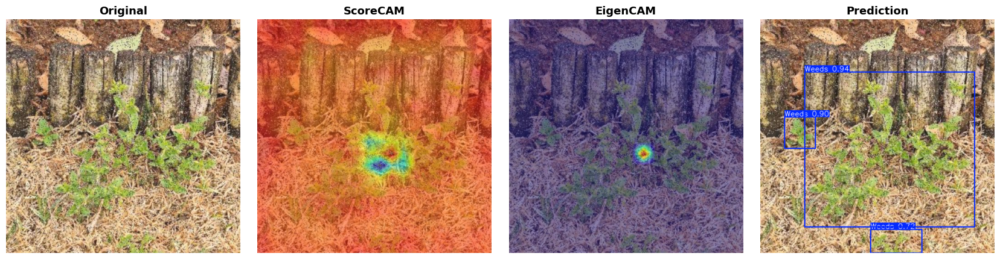

In [15]:
# Pick a sample test image
test_dir = Path(cfg["test"])
test_imgs = []
for ext in IMG_EXTS:
    test_imgs.extend(test_dir.glob(f"*{ext}"))

sample_img = random.choice(test_imgs)
print("Sample image:", sample_img.name)

# Model zoo for grid (rows)
MODEL_ZOO = {
    "YOLOv10n": BEST_WEIGHT_V10,  # trained weights from this notebook
    # "YOLO11n": "/kaggle/working/weeds_yolov11_train/yolov11_weeds/weights/best.pt",
    # "YOLO12n": "/kaggle/working/weeds_yolov12_train/yolov12_weeds/weights/best.pt",
}

# Fallback if trained weights missing
if not Path(BEST_WEIGHT_V10).exists():
    print("[WARN] Trained YOLOv10 weights not found. Using pretrained yolov10n.pt instead.")
    MODEL_ZOO = {"YOLOv10n (pretrained)": "yolov10n.pt"}

plot_xai_grid(
    models=MODEL_ZOO,
    img_path=sample_img,
    class_id=0,              # weeds class
    imgsz=IMAGE_SIZE,
    conf_pred=0.25,
    iou_pred=0.7,
    scorecam_channels=24,
)